# Stochastic Gradient Descent (SGD)

## Load Dataset from sklearn

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

In [2]:
from sklearn.datasets import fetch_california_housing
california = fetch_california_housing()

In [3]:
df = pd.DataFrame(california.data, columns=california.feature_names)
df["Target"] = california.target
df.tail()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Target
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847
20639,2.3886,16.0,5.254717,1.162264,1387.0,2.616981,39.37,-121.24,0.894


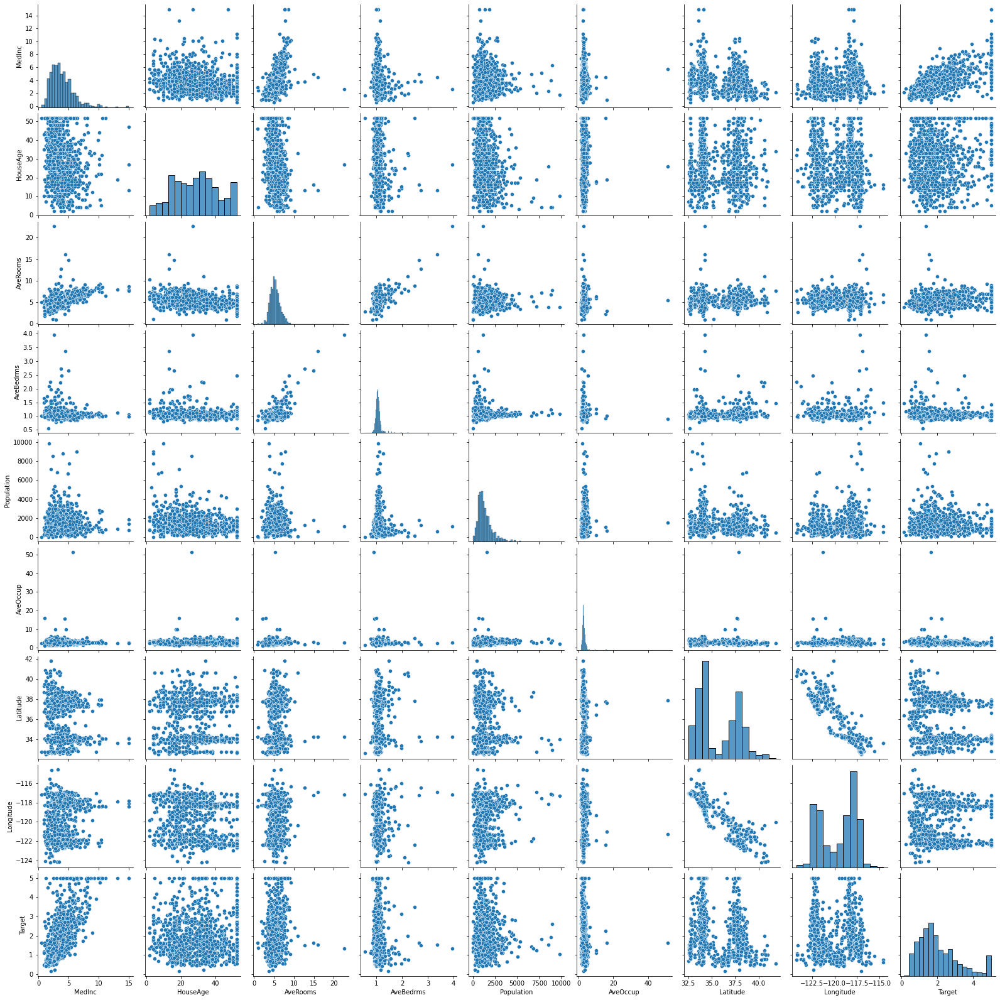

In [4]:
sns.pairplot(df.sample(1000))
plt.show()

In [5]:
scaler = StandardScaler()
scaler.fit(df.values[:, :-1])
df.values[:, :-1] = scaler.transform(df.values[:, :-1])

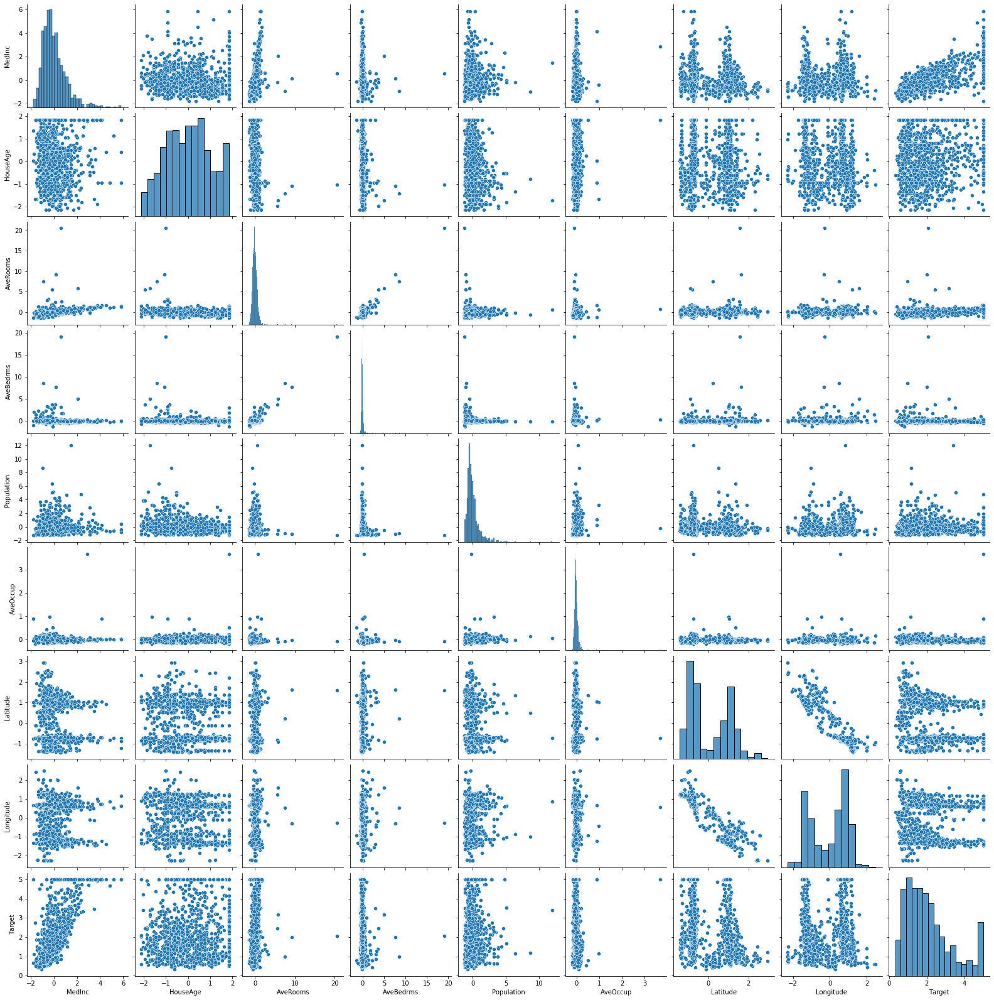

In [6]:
sns.pairplot(df.sample(1000))
plt.show()

## Train Model with PyTorch

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [7]:
data = torch.from_numpy(df.values).float()

data.shape

torch.Size([20640, 9])

In [8]:
x = data[:, :-1]
y = data[:, -1:]

print(x.shape, y.shape)

torch.Size([20640, 8]) torch.Size([20640, 1])


In [10]:
print(x[0:5, :])
print(y[0:5, :]) # 얘는 표준화가 안되었네

tensor([[ 2.3448,  0.9821,  0.6286, -0.1538, -0.9744, -0.0496,  1.0525, -1.3278],
        [ 2.3322, -0.6070,  0.3270, -0.2633,  0.8614, -0.0925,  1.0432, -1.3228],
        [ 1.7827,  1.8562,  1.1556, -0.0490, -0.8208, -0.0258,  1.0385, -1.3328],
        [ 0.9330,  1.8562,  0.1570, -0.0498, -0.7660, -0.0503,  1.0385, -1.3378],
        [-0.0129,  1.8562,  0.3447, -0.0329, -0.7598, -0.0856,  1.0385, -1.3378]])
tensor([[4.5260],
        [3.5850],
        [3.5210],
        [3.4130],
        [3.4220]])


In [16]:
n_epochs = 4000
batch_size = 256
print_interval = 200
learning_rate = 1e-2

## Build Models

In [13]:
print(x.size(), x.size(-1))

torch.Size([20640, 8]) 8


In [14]:
model = nn.Sequential(
    nn.Linear(x.size(-1), 6),
    nn.LeakyReLU(),
    nn.Linear(6, 5),
    nn.LeakyReLU(),
    nn.Linear(5, 4),
    nn.LeakyReLU(),
    nn.Linear(4, 3),
    nn.LeakyReLU(),
    nn.Linear(3, y.size(-1)),
)

model

Sequential(
  (0): Linear(in_features=8, out_features=6, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=6, out_features=5, bias=True)
  (3): LeakyReLU(negative_slope=0.01)
  (4): Linear(in_features=5, out_features=4, bias=True)
  (5): LeakyReLU(negative_slope=0.01)
  (6): Linear(in_features=4, out_features=3, bias=True)
  (7): LeakyReLU(negative_slope=0.01)
  (8): Linear(in_features=3, out_features=1, bias=True)
)

In [17]:
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

In [13]:
# |x| = (total_size, input_dim)
# |y| = (total_size, output_dim)

for i in range(n_epochs):
    # Shuffle the index to feed-forward.
    indices = torch.randperm(x.size(0))
    x_ = torch.index_select(x, dim=0, index=indices)
    y_ = torch.index_select(y, dim=0, index=indices)
    # 인덱스 셀렉트를 통해 위에서 섞인 인덱스를 기준으로 재정렬
    # x와 y를 같은 인덱스로 섞기 위해 인덱스를 먼저 구해줌!!!
    
    x_ = x_.split(batch_size, dim=0) # batch_size크기의 tensor가 들어있는 리스트
    y_ = y_.split(batch_size, dim=0)
    # |x_[i]| = (batch_size, input_dim)
    # |y_[i]| = (batch_size, output_dim)
    
    y_hat = []
    total_loss = 0
    
    for x_i, y_i in zip(x_, y_):
        # |x_i| = |x_[i]|
        # |y_i| = |y_[i]|
        y_hat_i = model(x_i)
        loss = F.mse_loss(y_hat_i, y_i)

        optimizer.zero_grad()
        loss.backward()

        optimizer.step()
        
        total_loss += float(loss) # This is very important to prevent memory leak. 그레디언트를 끊어주기
        y_hat += [y_hat_i]

    total_loss = total_loss / len(x_)
    if (i + 1) % print_interval == 0:
        print('Epoch %d: loss=%.4e' % (i + 1, total_loss))
    
y_hat = torch.cat(y_hat, dim=0) # 최종 y_hat
y = torch.cat(y_, dim=0) # 얘도 셔플링 된 y
# |y_hat| = (total_size, output_dim)
# |y| = (total_size, output_dim)

Epoch 200: loss=3.3620e-01
Epoch 400: loss=3.1224e-01
Epoch 600: loss=3.1349e-01
Epoch 800: loss=3.1115e-01
Epoch 1000: loss=3.1101e-01
Epoch 1200: loss=3.0942e-01
Epoch 1400: loss=3.0967e-01
Epoch 1600: loss=3.0942e-01
Epoch 1800: loss=3.0878e-01
Epoch 2000: loss=3.0931e-01
Epoch 2200: loss=3.0866e-01
Epoch 2400: loss=3.0938e-01
Epoch 2600: loss=3.0830e-01
Epoch 2800: loss=3.0768e-01
Epoch 3000: loss=3.0786e-01
Epoch 3200: loss=3.0829e-01
Epoch 3400: loss=3.0780e-01
Epoch 3600: loss=3.0782e-01
Epoch 3800: loss=3.0736e-01
Epoch 4000: loss=3.0732e-01


## Let's see the result!

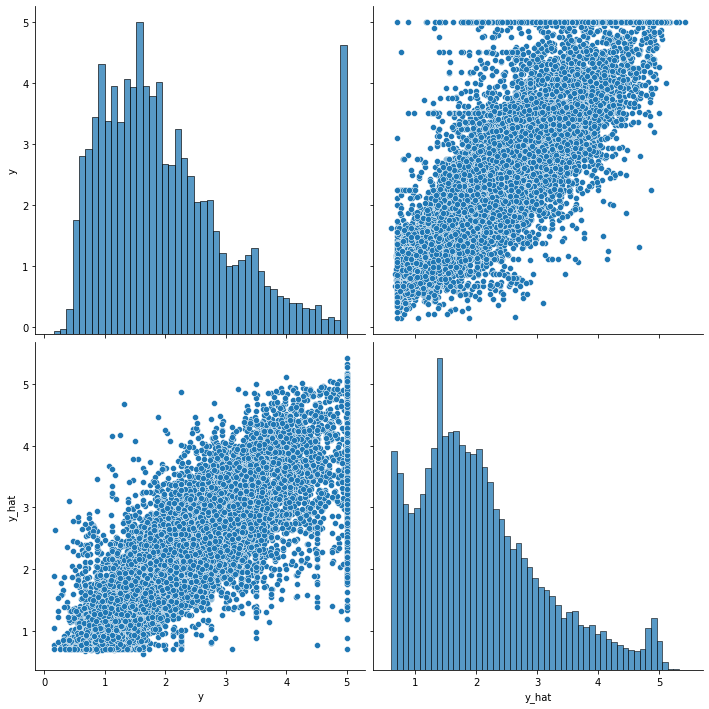

In [14]:
df = pd.DataFrame(torch.cat([y, y_hat], dim=1).detach().numpy(),
                  columns=["y", "y_hat"])

sns.pairplot(df, height=5)
plt.show()